In [25]:
import re 
import json
import nltk 
import string 
import multiprocessing
import numpy as np
import pandas as pd
from numpy import asarray
from numpy import savetxt
from nltk.stem.porter import *
from collections import Counter
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook
from nltk.corpus import stopwords 
from nltk.stem import WordNetLemmatizer 
lemmatizer = WordNetLemmatizer() 
from nltk.tokenize import word_tokenize
from wordcloud import WordCloud, STOPWORDS
np.random.seed(2018)
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_colwidth', -1)
pd.set_option('display.float_format', lambda x: '%.3f' % x)
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
plt.style.use('classic')
%matplotlib inline
s=12

__author__ = 'HK Dambanemuya'
__version__ = 'Python2'

In [2]:
df = pd.read_csv("../../Data/Fusion/discussions.csv")

In [3]:
stop_words = stopwords.words("english")
stop_words.extend(['coronavirus', 'covid', 'virus', 'news', 'new', 'outbreak', 'pandemic', 'click', 'expand'])

In [4]:
# convert to lowercase
def text_lowercase(text): 
    return text.decode('ascii', 'ignore').lower() 

# remove numbers
def remove_numbers(text): 
    result = re.sub(r'\d+', '', text.encode('ascii', 'ignore')) 
    return result 

# remove whitespace from text 
def remove_whitespace(text): 
    return  " ".join(text.encode('ascii', 'ignore').split())

# remove stopwords 
def remove_stopwords(text): 
    word_tokens = word_tokenize(text.encode('ascii', 'ignore')) 
    filtered_text = [word for word in word_tokens if word not in stop_words] 
    return filtered_text 

# pre-process text
def pre_process(text):
    text_lower = text_lowercase(str(text).decode('ascii', 'ignore'))
    no_numbers = remove_numbers(text_lower)
    no_punctuation = no_numbers.translate(None, string.punctuation)
    no_whitespace = remove_whitespace(no_punctuation)
    no_stopwords = remove_stopwords(no_whitespace)
    lemmas = [lemmatizer.lemmatize(token) for token in no_stopwords]
    no_chars = [i for i in lemmas if len(i) > 1]
    return no_chars   

# get bi-grams
def bi_grams(tokens):
    return list(nltk.bigrams(tokens))

In [5]:
pool = multiprocessing.Pool(processes=8)

Process PoolWorker-6:
Process PoolWorker-8:
Process PoolWorker-5:
Process PoolWorker-1:
Process PoolWorker-3:
Process PoolWorker-7:
Process PoolWorker-2:
Traceback (most recent call last):
Process PoolWorker-4:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/System/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/multiprocessing/process.py", line 267, in _bootstrap
Traceback (most recent call last):
Traceback (most recent call last):
  File "/System/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/multiprocessing/process.py", line 267, in _bootstrap
  File "/System/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/multiprocessing/process.py", line 267, in _bootstrap
Traceback (most recent call last):
  File "/System/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/multiprocessing/process.py", line 267, in _bootstrap
  File "/System/

In [6]:
titles = pool.map(pre_process, df['text'].dropna())

In [7]:
words = [element for lis in titles for element in lis]

In [9]:
print Counter(words).most_common(100) 

[('people', 489334), ('said', 366733), ('one', 270592), ('like', 268774), ('time', 267324), ('would', 261007), ('get', 260550), ('case', 252984), (u'day', 226223), ('china', 209153), ('also', 207589), ('dont', 205902), ('health', 185668), ('week', 176901), (u'year', 176604), ('im', 173434), ('know', 173223), ('even', 170154), ('going', 161632), (u'country', 159009), ('go', 158535), ('trump', 155947), ('could', 152863), ('need', 151994), ('think', 149200), ('thing', 141653), (u'work', 139787), ('many', 139412), ('world', 135165), (u'make', 132345), ('state', 131482), ('government', 130519), ('may', 130024), ('home', 129893), ('death', 129161), ('say', 128800), ('still', 127796), ('take', 127049), (u'number', 121682), ('first', 121276), ('see', 120951), ('much', 120914), ('well', 120533), (u'spread', 116442), ('flu', 115499), ('good', 115280), ('back', 114560), ('last', 113585), ('way', 110922), ('market', 108494), ('rate', 106901), ('right', 106180), ('want', 103280), ('disease', 103201

In [10]:
grams_collection = pool.map(bi_grams, titles)

In [11]:
topics = []
for grams in tqdm_notebook(grams_collection):
    topics.extend(grams)

In [12]:
len(titles), len(topics)

(412165, 61204163)

### Save Discussion Topics to File

In [21]:
top_1k = Counter(topics).most_common(1000)

In [22]:
# d1k = [i[0] for i in top_1k]

In [28]:
with open('../../Reloaded/Data/topics_d.csv', 'w') as f:
    f.write(json.dumps(top_1k))

### Visualize Topics

In [14]:
wordcloud = WordCloud(stopwords=stop_words, max_font_size=24, max_words=100, background_color="white").generate(string.join(words))

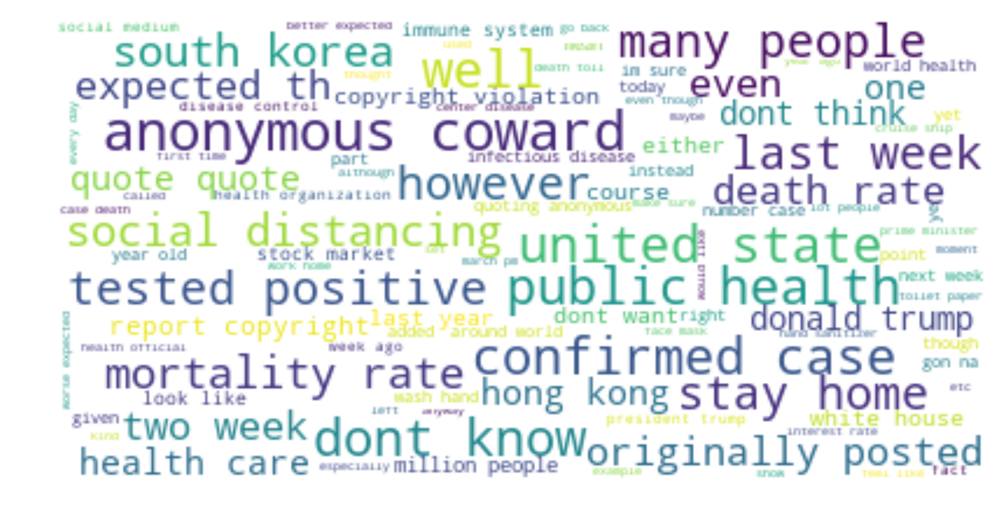

In [15]:
plt.figure(figsize=(8, 5), dpi=1080)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout()
plt.show()